In [6]:
from sys import warnoptions
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
import warnings
warnings.filterwarnings('ignore')
sns.set_style()

In [8]:
data = pd.read_csv("train.csv")

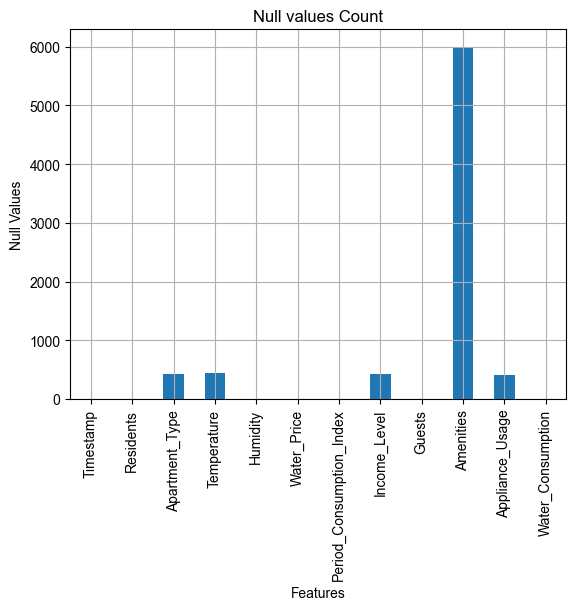

'\nMore Null values in the feature Amenities\n'

In [9]:
"""
Null values in the data
"""
data.isnull().sum().plot(kind="bar")
sns.set("notebook")
plt.grid(True)
plt.xticks(rotation=90)
plt.title("Null values Count")
plt.xlabel("Features")
plt.ylabel("Null Values")
plt.show()
"""
More Null values in the feature Amenities
"""


In [10]:
categorical_features = [value for value in list(data.columns) if isinstance(data[value][0],str)]
numerical_features = [value for value in list(data.columns) if not isinstance(data[value][0], str)]

In [11]:
"""
function for Co realatoin heat map to see the correlation between the features
"""
def corelation_heatmap(data,features):
  corr_matrix = data[features].corr()
  plt.figure(figsize=(10, 6), facecolor="white")
  sns.set_style("whitegrid")
  ax = sns.heatmap(
      corr_matrix,
      annot=True,
      fmt=".2f",
      cmap="coolwarm",
      linewidths=0.5,
      linecolor="black",
      annot_kws={"size": 12, "weight": "bold"},
      cbar_kws={"shrink": 0.8, "aspect": 40}
  )
  plt.title("Correlation Heatmap", fontsize=16, fontweight="bold", pad=15)
  plt.xticks(rotation=45, ha="right", fontsize=10, fontweight="bold", color="black")
  plt.yticks(fontsize=10, fontweight="bold", color="black")
  plt.tight_layout()
  plt.show()

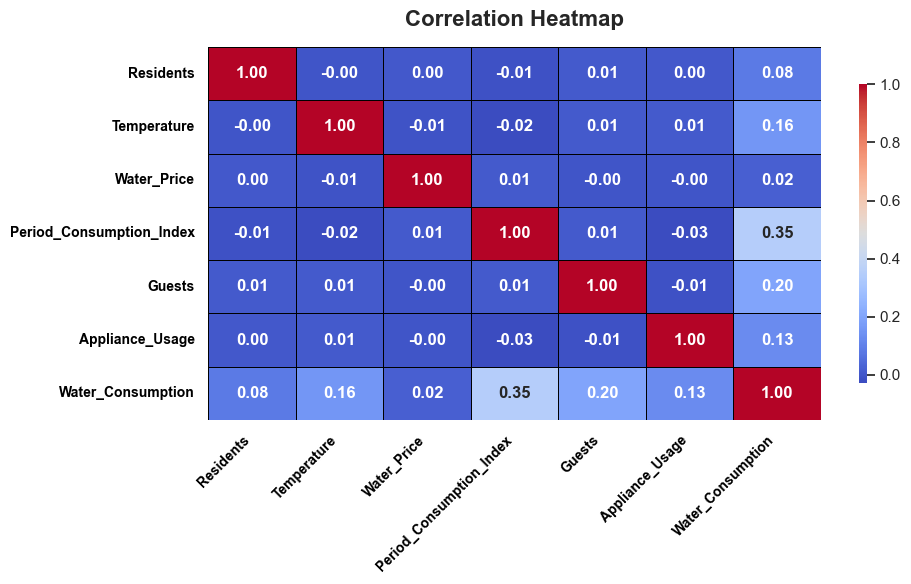

In [12]:
corelation_heatmap(data,numerical_features)

In [14]:
## Start the process of data cleaning
train_data =  pd.read_csv("train.csv")
train_data
test_data = pd.read_csv("test.csv")
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6000 entries, 0 to 5999
Data columns (total 2 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Timestamp          6000 non-null   object 
 1   Water_Consumption  6000 non-null   float64
dtypes: float64(1), object(1)
memory usage: 93.9+ KB


In [15]:
def preprocess_data(train_data):
    """
    Preprocess train_data by cleaning columns, handling NaNs, and transforming Timestamp.

    Parameters:
        train_data (pd.DataFrame): Raw input DataFrame

    Returns:
        pd.DataFrame: Cleaned and processed DataFrame
    """
    # Create a copy to avoid modifying the original
    df = train_data.copy()

    # 1. Filter valid Income_Level values
    valid_income_levels = ["Middle", "Upper Middle", "Low", "Rich"]
    df = df[df['Income_Level'].isin(valid_income_levels)]
    # 2. Clean and convert Humidity
    def is_valid_number(value):
        if pd.isna(value):
            return False
        try:
            float(value)
            return True
        except (ValueError, TypeError):
            return False

    df['Humidity'] = df['Humidity'].apply(lambda x: x if is_valid_number(x) else None)
    df['Humidity'] = pd.to_numeric(df['Humidity'], errors='coerce')
    humidity_mean = df['Humidity'].mean()
    df['Humidity'] = df['Humidity'].fillna(humidity_mean if pd.notna(humidity_mean) else 0.0)

    # 3. Fill NaNs in other columns
    df['Appliance_Usage'] = df['Appliance_Usage'].fillna(0.0)
    df['Guests'] = df['Guests'].abs()

    if "None" in df['Amenities'].dropna().unique():
        print("Warning: 'None' already exists in Amenities—consider a different fill value")
    df['Amenities'] = df['Amenities'].fillna("None")

    temp_mean = df['Temperature'].mean()
    df['Temperature'] = df['Temperature'].fillna(temp_mean if pd.notna(temp_mean) else 0.0)

    # 4. Drop NaNs in specific columns
    df = df.dropna(subset=['Apartment_Type'])

    df = df.dropna(subset=['Water_Price'])

    # 5. Process Timestamp
    df['Timestamp'] = df['Timestamp'].astype(str).str.replace('/', '-', regex=False)

    def split_timestamp(ts):
        parts = ts.split(' ')
        return parts[0], parts[1] if len(parts) > 1 else '0'

    df[['Date', 'Hours']] = pd.DataFrame(
        df['Timestamp'].apply(split_timestamp).tolist(),
        index=df.index
    )

    df['Hours'] = pd.to_numeric(df['Hours'], errors='coerce').fillna(0).astype(int)

    def swapchars(date):
        if pd.isna(date) or len(date) < 5:
            return date
        date_list = list(date)
        date_list[0], date_list[3] = date_list[3], date_list[0]  # Swap 0 and 3
        date_list[1], date_list[4] = date_list[4], date_list[1]  # Swap 1 and 4
        return ''.join(date_list)

    df['Date'] = df['Date'].apply(swapchars)
    df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
    invalid_dates = df['Date'].isna().sum()
    df = df.drop('Timestamp',axis = 1)
    if invalid_dates > 0:
        print(f"Warning: {invalid_dates} dates failed to convert")
    return df

In [16]:
processed_data = preprocess_data(train_data)
processed_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12754 entries, 0 to 13998
Data columns (total 13 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Residents                 12754 non-null  int64         
 1   Apartment_Type            12754 non-null  object        
 2   Temperature               12754 non-null  float64       
 3   Humidity                  12754 non-null  float64       
 4   Water_Price               12754 non-null  float64       
 5   Period_Consumption_Index  12754 non-null  float64       
 6   Income_Level              12754 non-null  object        
 7   Guests                    12754 non-null  int64         
 8   Amenities                 12754 non-null  object        
 9   Appliance_Usage           12754 non-null  float64       
 10  Water_Consumption         12754 non-null  float64       
 11  Date                      12754 non-null  datetime64[ns]
 12  Hours                  

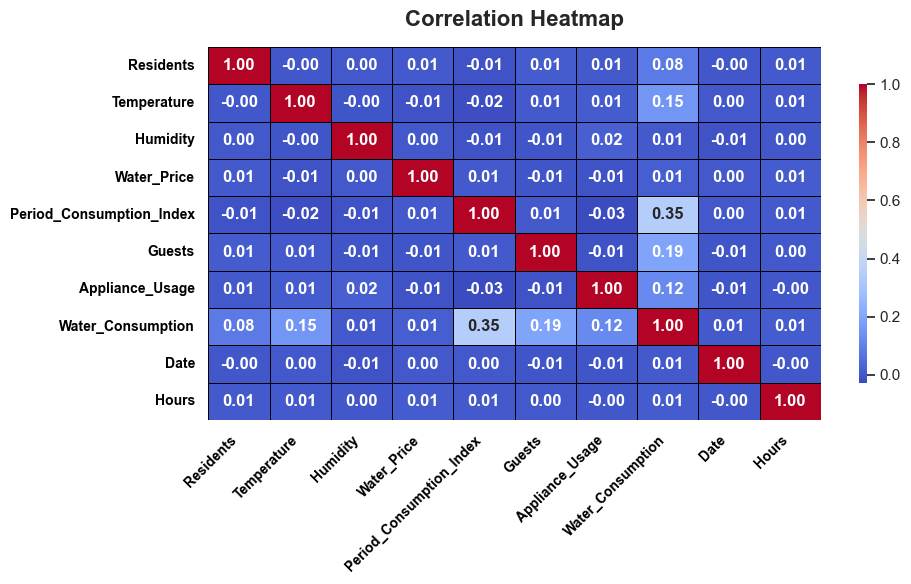

In [17]:
numerical_columns = [value for value in list(processed_data.columns) if not isinstance(processed_data[value][0], str)]
corelation_heatmap(processed_data,numerical_columns)

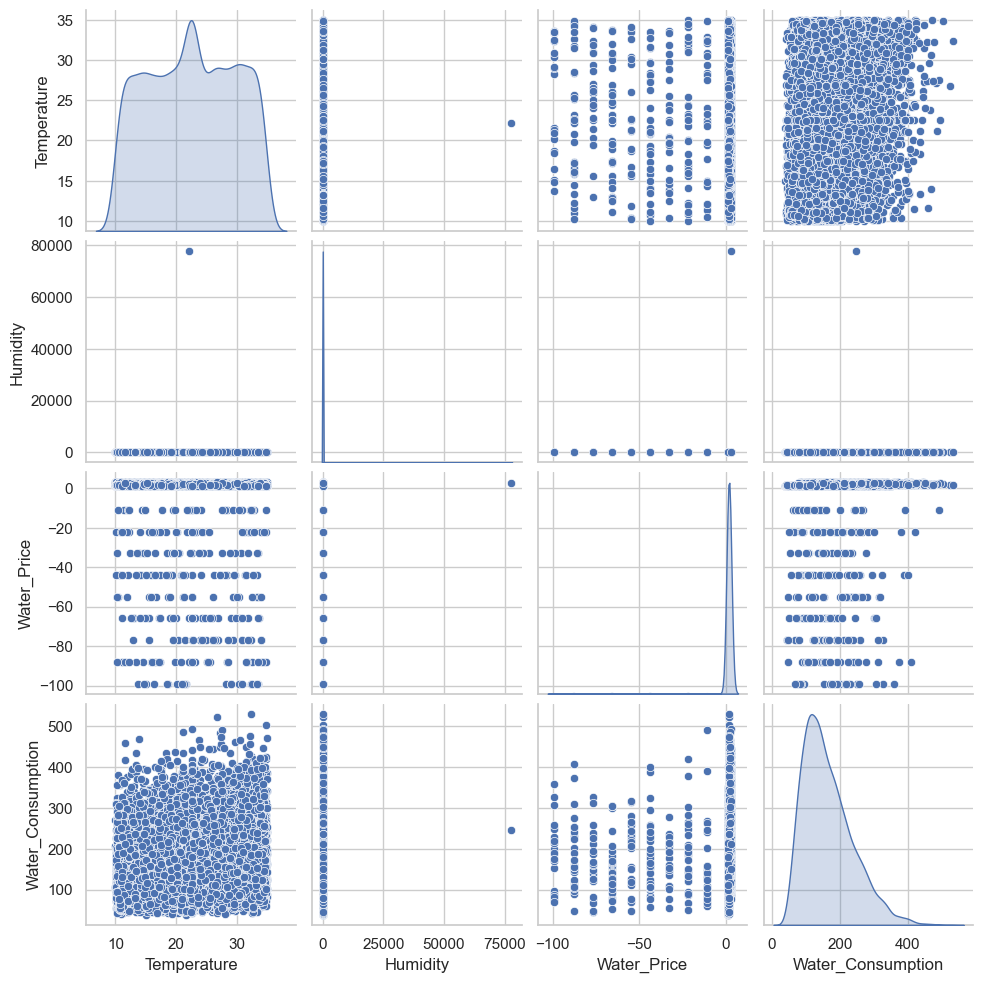

In [18]:
pair_plot = processed_data[["Temperature","Humidity","Water_Price","Water_Consumption"]]
sns.pairplot(pair_plot, diag_kind='kde')
plt.show()

In [19]:
"""
Function feature_extraction takes dataframe and two boolean values one for to include date and one for to extract the
features that are dependent on the traget_varaible and it returns DataFrame
"""
def feature_extraction(train_data, drop_date=False, target_dependent_features=False):
    df = train_data.copy()
    df.sort_values(['Date', 'Hours'], inplace=True)  # Ensure chronological order
    df['Total_People'] = df['Residents'].fillna(0) + df['Guests'].fillna(0)
    # Features depending on the target variable
    if target_dependent_features:
        df['Rolling_Mean_Water_Con'] = df['Water_Consumption'].rolling(window=7, min_periods=1).mean()
        df['Rolling_Mean_Appliance'] = df['Appliance_Usage'].rolling(window=7, min_periods=1).mean()
        df['Consumption_per_Person'] = df['Water_Consumption'] / (df['Total_People'] + 1e-6)  # Avoid division by zero
        df['Lag1_Water_Con'] = df['Water_Consumption'].shift(1).fillna(df['Water_Consumption'].mean())

    # Lagging Features
    df['Lag1_Period_Con'] = df['Period_Consumption_Index'].shift(1).fillna(df['Period_Consumption_Index'].mean())
    df['Day_of_Week'] = df['Date'].dt.dayofweek
    df['Month'] = df['Date'].dt.month
    df['Is_Weekend'] = df['Day_of_Week'].isin([5, 6]).astype(int)
    df['Hour_Category'] = pd.cut(df['Hours'], bins=[-1, 8, 16, 24], labels=[0, 1, 2])

    # Interaction Features
    df['Cost_of_Consumption'] = df['Water_Price'].fillna(0) * df['Period_Consumption_Index'].fillna(0)
    df['Temp_Humidity'] = df['Temperature'].fillna(0) * df['Humidity'].fillna(0)
    df['Consumption_Per_Resident'] = df['Period_Consumption_Index'].fillna(0) / (df['Residents'].replace(0, np.nan))

    # Cost per Consumption Unit (Avoid division by zero)
    df['Cost_Per_Consumption'] = df['Water_Price'] / df['Period_Consumption_Index'].replace(0, np.nan)

    # Amenity Availability Flag
    df['Amenities'] = df['Amenities'].fillna("None")
    df['Amenity_Flag'] = df['Amenities'].apply(lambda x: 1 if x != 'None' else 0)

    # Temperature-Humidity Comfort Index
    df['Comfort_Index'] = df['Temperature'].fillna(0) + 0.33 * df['Humidity'].fillna(0) - 0.7

    # Categorical Encoding (Handle missing values before encoding)
    df['Apartment_Type'] = df['Apartment_Type'].fillna("Unknown")
    df['Income_Level'] = df['Income_Level'].fillna("Unknown")

    amenities_dummies = pd.get_dummies(df['Amenities'], prefix='Amenities', dtype=int)
    apt_dummies = pd.get_dummies(df['Apartment_Type'], prefix='Apartment_Type', dtype=int)
    income_dummies = pd.get_dummies(df['Income_Level'], prefix='Income_Level', dtype=int)

    df = pd.concat([df, amenities_dummies, apt_dummies, income_dummies], axis=1)

    # Drop Unwanted Features
    df = df.drop(columns=['Apartment_Type', 'Income_Level', 'Amenities'])
    if drop_date:
        df = df.drop(columns=['Date'])

    return df

<h3>Training Phase one
<br>
<p>
In the phase one training we preprocess the data and clean the data and extrac the features that are independent on the target Variable.
<p>
<br>
These features are given to the machine learning models and we will check them how they are performing and select the best model out of them
<br>


In [20]:
pre_processed_data = preprocess_data(train_data)
target_independent_features = feature_extraction(pre_processed_data,True,False)

In [21]:
def get_x_and_y(data):
  X_data = data.drop('Water_Consumption', axis=1)
  y_data = data['Water_Consumption'].values
  return X_data,y_data
X_data_2,y_data2 = get_x_and_y(target_independent_features)
stand = StandardScaler()
X_data2 = stand.fit_transform(X_data_2.values)
print("Shape of the data target variable independent ",X_data2.shape)

Shape of the data target variable independent  (12754, 36)


In [22]:
def split_data(x_data,y_data):
  X_train,X_test,y_train,y_test = train_test_split(x_data,y_data,test_size=0.2,random_state=42)
  return X_train,y_train,X_test,y_test

In [23]:
X_train2 ,y_train2,X_test2,y_test2 = split_data(X_data2,y_data2)


In [24]:
def machinelearning_model(x_train,y_train,x_test,model_name):
  model = None
  if model_name == "RandomForest":
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    model.fit(x_train, y_train)
    predictions = model.predict(x_test)
  elif model_name == "LinearRegression":
    model = LinearRegression()
    model.fit(x_train,y_train)
    predictions = model.predict(x_test)
  elif model_name == "DecisionTree":
    model = DecisionTreeRegressor()
    model.fit(x_train,y_train)
    predictions = model.predict(x_test)
  else:
    model = XGBRegressor()
    model.fit(x_train,y_train)
    predictions = model.predict(x_test)
  return predictions,model

In [25]:
y_pred1,rf_model = machinelearning_model(X_train2,y_train2,X_test2,"RandomForest")
y_pred2,linear_model = machinelearning_model(X_train2,y_train2,X_test2,"LinearRegression")
y_pred3,tree_model = machinelearning_model(X_train2,y_train2,X_test2,"DecisionTree")
y_pred4,xg_model = machinelearning_model(X_train2,y_train2,X_test2,"XGBoosting")
score1 = max(0,100- np.sqrt(mean_squared_error(y_test2,y_pred1)))
score2 = max(0,100- np.sqrt(mean_squared_error(y_test2,y_pred2)))
score3 = max(0,100- np.sqrt(mean_squared_error(y_test2,y_pred3)))
score4 = max(0,100- np.sqrt(mean_squared_error(y_test2,y_pred4)))
print("Accuracy score for Random Forest       ",score1)
print("Accuracy score for Linear Regression   ",   score2)
print("Accuracy score for Decision Tree       ",       score3)
print("Accuracy score for XGBoosting Algorithm",score4)

Accuracy score for Random Forest        83.3716589548233
Accuracy score for Linear Regression    71.85525364738892
Accuracy score for Decision Tree        73.06725206211419
Accuracy score for XGBoosting Algorithm 87.36513615932017


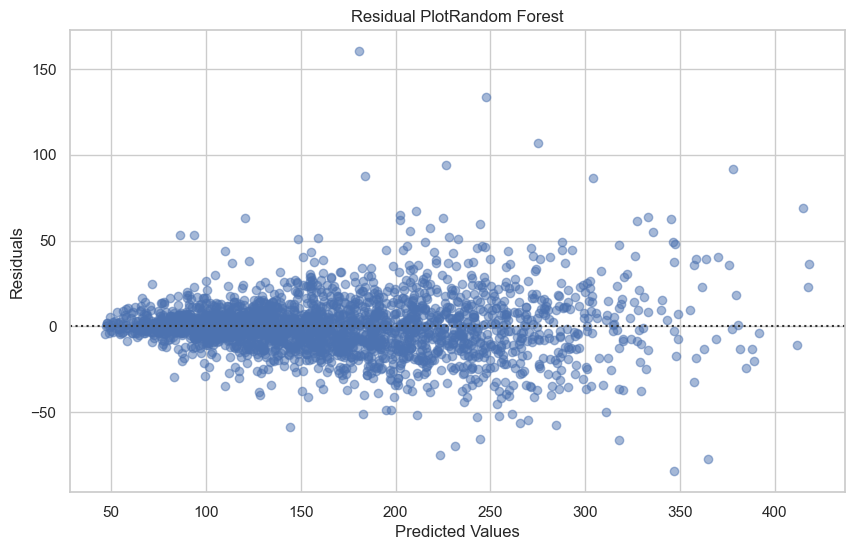

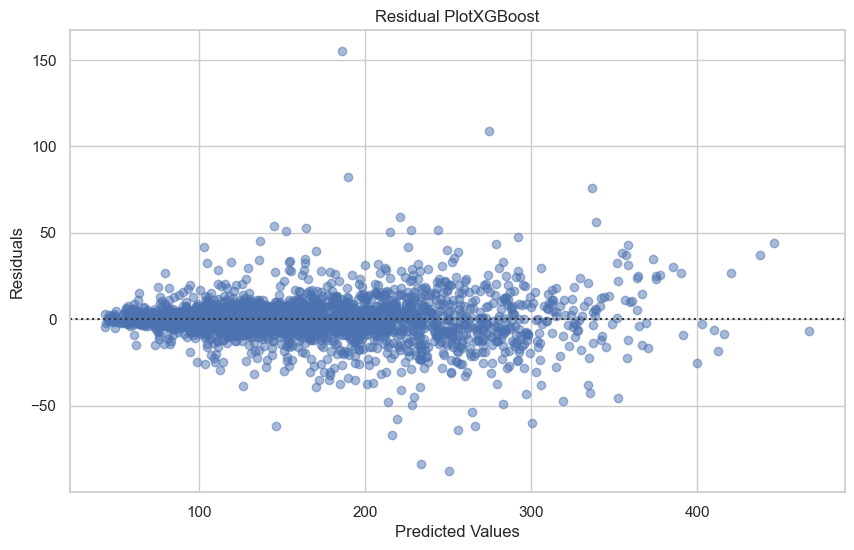

In [27]:
def make_residual_plot(y_pred,y_test,model_name):
  residuals = y_test-y_pred
  plt.figure(figsize=(10, 6))
  sns.residplot(x=y_pred, y=residuals,  scatter_kws={'alpha': 0.5})
  plt.xlabel("Predicted Values")
  plt.ylabel("Residuals")
  plt.title(f"Residual Plot{model_name}")
  return plt.show()
make_residual_plot(y_pred1,y_test2,"Random Forest")
make_residual_plot(y_pred4,y_test2,"XGBoost")

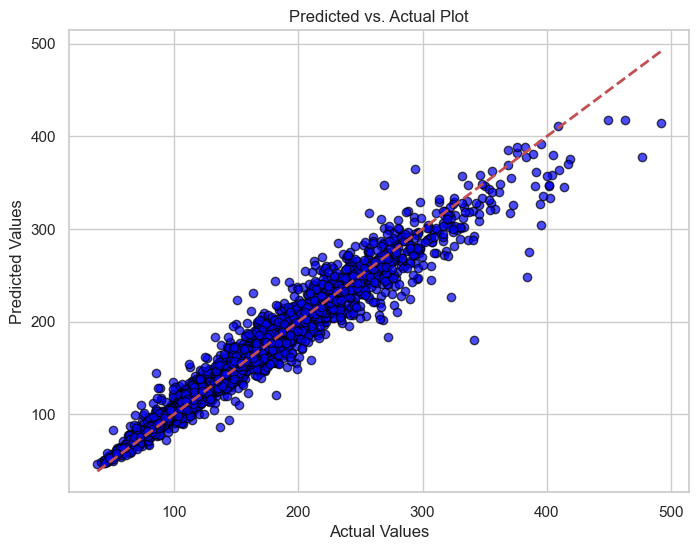

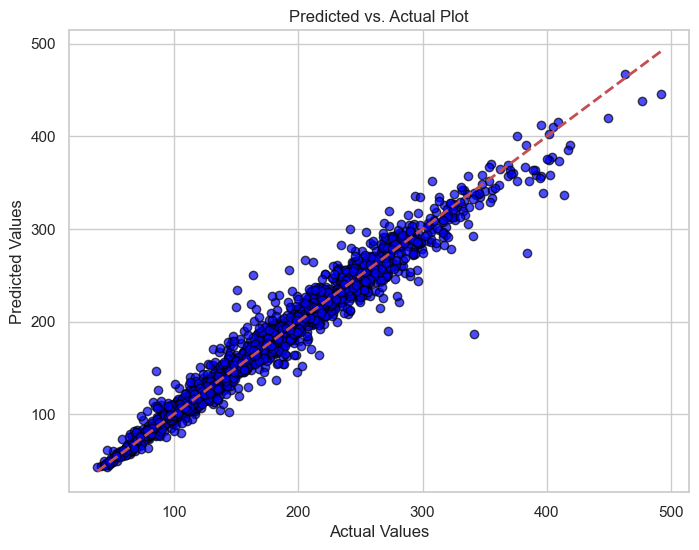

In [28]:
def scatter_plot(y_test,y_pred,model_name):
  plt.figure(figsize=(8, 6))
  plt.scatter(y_test, y_pred, alpha=0.7, color="blue", edgecolors="black")
  plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', linewidth=2)
  plt.xlabel("Actual Values")
  plt.ylabel("Predicted Values")
  plt.title("Predicted vs. Actual Plot")
  return plt.show()
scatter_plot(y_test2,y_pred1,"Random Forest")
scatter_plot(y_test2,y_pred4,"XGBoost")

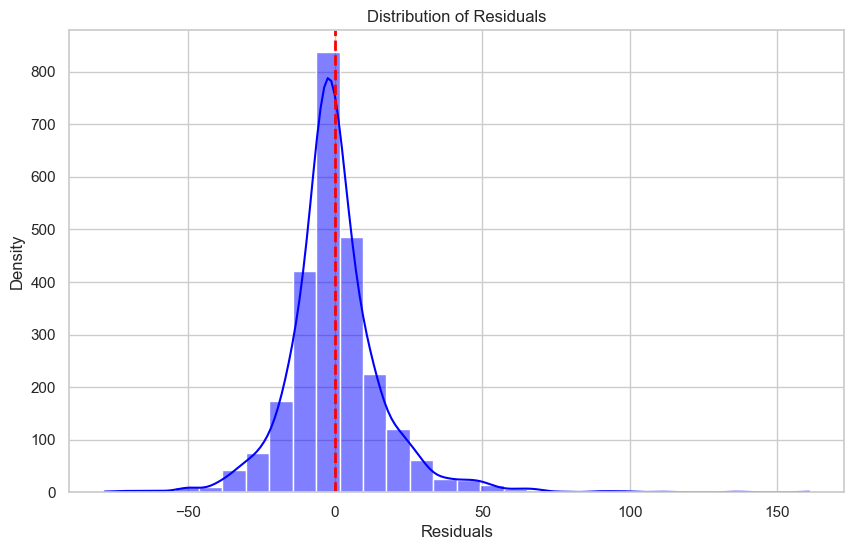

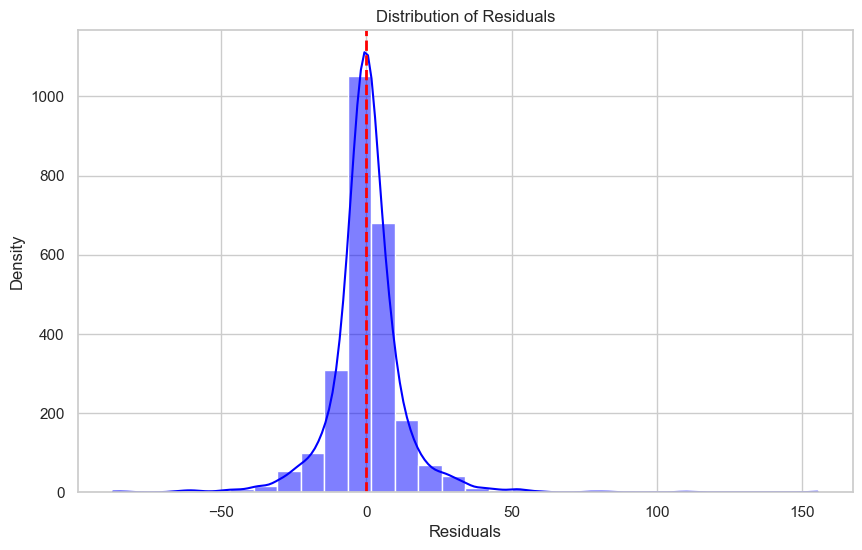

In [29]:
def histogram_plot(y_test,y_pred,model_name):
  residuals = y_test - y_pred
  plt.figure(figsize=(10, 6))
  sns.histplot(residuals, kde=True, bins=30, color="blue")
  plt.axvline(0, color='red', linestyle='--', linewidth=2)
  plt.xlabel("Residuals")
  plt.ylabel("Density")
  plt.title("Distribution of Residuals")
  plt.show()
histogram_plot(y_test2,y_pred1,"Random Forest")
histogram_plot(y_test2,y_pred4,"XGBoost")

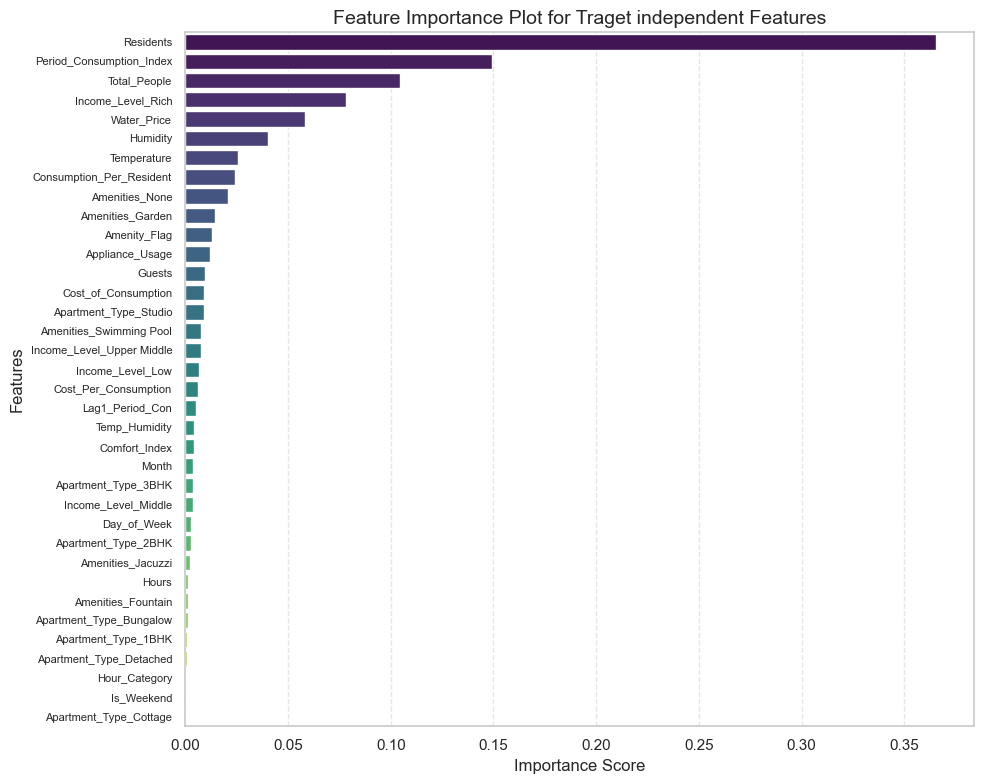

In [30]:
importances = list(rf_model.feature_importances_)
features = X_data_2.columns
features_dict = {features[i]: importances[i] for i in range(len(features)) if importances[i]>0}
features_dict = dict(sorted(features_dict.items(), key=lambda x: x[1], reverse=True))  # Sort descending
plt.figure(figsize=(10, 8))
sns.barplot(x=list(features_dict.values()), y=list(features_dict.keys()), palette="viridis")
plt.xlabel("Importance Score", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.yticks(fontsize = 8)
plt.title("Feature Importance Plot for Traget independent Features", fontsize=14)
plt.grid(axis='x', linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


In [31]:
"""
Considering some the test_values form the training data to check the trend between the predicted values and original values to know how our model is perfroming
"""
test_values = train_data[300:450]


In [32]:
test_values

,Timestamp,Residents,Apartment_Type,Temperature,Humidity,Water_Price,Period_Consumption_Index,Income_Level,Guests,Amenities,Appliance_Usage,Water_Consumption
300,11/04/2002 00,2,NaN,15.48,49.41,1.66,1.646998,Middle,0,NaN,0.0,76.43
301,11/04/2002 08,2,1BHK,34.10,36.9,1.01,1.140000,NaN,0,NaN,0.0,115.15
302,11/04/2002 16,4,3BHK,13.65,54.13,1.96,1.450000,Upper Middle,0,NaN,1.0,232.52
303,12/04/2002 00,4,2BHK,25.84,55.5,1.20,1.200000,Middle,1,NaN,0.0,190.22
304,12/04/2002 08,2,Studio,29.73,45.08,1.54,0.830000,Low,1,NaN,NaN,84.18
...,...,...,...,...,...,...,...,...,...,...,...,...
445,29/05/2002 08,3,1BHK,15.54,75.2,1.61,1.390000,Middle,0,NaN,0.0,109.25
446,29/05/2002 16,4,3BHK,20.22,61.49,2.75,0.970000,Upper Middle,0,Garden,0.0,136.39
447,30/05/2002 00,2,Studio,11.47,53.19,1.65,0.980000,Low,1,NaN,0.0,69.46
448,30/05/2002 08,2,1BHK,30.49,54.31,1.43,1.390000,v`o/f,0,NaN,0.0,118.92


In [33]:
test_data = preprocess_data(test_values)
test_features = feature_extraction(test_data,False,False)

In [34]:
test_values = test_features.drop(["Water_Consumption",'Date'],axis = 1).values
test_feature_values = stand.fit_transform(test_values)
y_perd_values = xg_model.predict(test_feature_values)
y_perd_values

array([177.69072 , 165.85475 , 100.46242 , 120.199135, 137.8272  ,
       148.03609 , 195.70552 ,  96.66068 ,  76.79951 , 219.02443 ,
       109.55389 , 117.349045, 113.745834, 105.09744 , 100.63029 ,
       136.71112 , 129.66957 , 312.9874  , 185.75905 , 152.04883 ,
       270.5423  , 148.5949  , 180.56711 ,  58.697144, 105.13707 ,
       332.20172 , 177.19157 , 147.15144 , 133.59927 , 176.28825 ,
        82.20887 , 112.92744 ,  86.42848 , 117.96673 , 176.90224 ,
        68.53051 , 107.55297 , 188.00587 , 106.12616 ,  98.47787 ,
       141.30832 ,  78.57259 , 343.79605 , 118.06024 , 103.20104 ,
       321.37827 , 120.948074,  56.945145, 272.0472  , 112.98475 ,
       141.70517 , 124.33813 , 214.41922 , 108.038574, 173.01532 ,
       110.262375,  93.952774, 112.00324 , 241.99606 , 271.2292  ,
       167.59274 , 219.35617 , 122.836395, 177.96376 , 129.3683  ,
       337.23157 , 143.62442 , 160.7516  , 116.57346 ,  90.31979 ,
       140.04724 , 354.54922 ,  99.296555, 113.25358 , 297.817

In [35]:
import plotly.graph_objects as go
import pandas as pd
set_values = test_features[["Date", "Water_Consumption"]]
set_values["Date"] = pd.to_datetime(set_values["Date"])
fig = go.Figure()

# Actual Water Consumption Line
fig.add_trace(go.Scatter(
    x=set_values["Date"],
    y=set_values["Water_Consumption"],
    mode='lines+markers',
    name='Actual Consumption',
    line=dict(color='blue', width=2),
    marker=dict(size=6, symbol='circle')
))

# Predicted Water Consumption Line
fig.add_trace(go.Scatter(
    x=set_values["Date"],
    y=y_perd_values,
    mode='lines+markers',
    name='Predicted Consumption',
    line=dict(color='red', width=2, dash='dot'),
    marker=dict(size=6, symbol='circle')
))


fig.update_layout(
    title="Water Consumption Over Time",
    xaxis_title="Date",
    yaxis_title="Water Consumption (units)",
    xaxis=dict(
        tickangle=-45,
        showgrid=True,
        type='date',
        tickformat="%b %d, %Y"
    ),
    yaxis=dict(showgrid=True, zeroline=False),
    legend=dict(
        x=0.01,
        y=1,
        bgcolor='rgba(255,255,255,0.6)'
    ),
    plot_bgcolor="rgba(245, 245, 250, 1)",
    hovermode="x unified"
)

fig.show()


<h3> Second Phase
<br>
We will extract the features that are dependent on the target variable
<br>
Then we will apply machine learning algorithms and then we will choose best on amoung them.

In [36]:
target_dependent_features = feature_extraction(pre_processed_data,True,True)
target_dependent_features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12754 entries, 0 to 13998
Data columns (total 41 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Residents                  12754 non-null  int64   
 1   Temperature                12754 non-null  float64 
 2   Humidity                   12754 non-null  float64 
 3   Water_Price                12754 non-null  float64 
 4   Period_Consumption_Index   12754 non-null  float64 
 5   Guests                     12754 non-null  int64   
 6   Appliance_Usage            12754 non-null  float64 
 7   Water_Consumption          12754 non-null  float64 
 8   Hours                      12754 non-null  int64   
 9   Total_People               12754 non-null  int64   
 10  Rolling_Mean_Water_Con     12754 non-null  float64 
 11  Rolling_Mean_Appliance     12754 non-null  float64 
 12  Consumption_per_Person     12754 non-null  float64 
 13  Lag1_Water_Con             12754 non

In [37]:
X_data_1,y_data_1 = get_x_and_y(target_dependent_features)
X_data1 = stand.fit_transform(X_data_1.values)
print("Shape of the data target variable independent ",X_data1.shape)
X_train1,y_train1,X_test1,y_test1=split_data(X_data1,y_data_1)

Shape of the data target variable independent  (12754, 40)


In [38]:
print(""" Accuracys of Machine learning algorithms that are dependent on the target variable
""")
y_pred1,rf_model1 = machinelearning_model(X_train1,y_train1,X_test1,"RandomForest")
y_pred2,linear_model1 = machinelearning_model(X_train1,y_train1,X_test1,"LinearRegression")
y_pred3,tree_model1 = machinelearning_model(X_train1,y_train1,X_test1,"DecisionTree")
y_pred4,xg_model1 = machinelearning_model(X_train1,y_train1,X_test1,"XGBoosting")
score1 = max(0,100- np.sqrt(mean_squared_error(y_test1,y_pred1)))
score2 = max(0,100- np.sqrt(mean_squared_error(y_test1,y_pred2)))
score3 = max(0,100- np.sqrt(mean_squared_error(y_test1,y_pred3)))
score4 = max(0,100- np.sqrt(mean_squared_error(y_test1,y_pred4)))
print("Accuracy score for Random Forest       ",score1)
print("Accuracy score for Linear Regression   ",   score2)
print("Accuracy score for Decision Tree       ",       score3)
print("Accuracy score for XGBoosting Algorithm",score4)

 Accuracys of Machine learning algorithms that are dependent on the target variable

Accuracy score for Random Forest        94.56099149199481
Accuracy score for Linear Regression    76.14785923430263
Accuracy score for Decision Tree        92.8235997040738
Accuracy score for XGBoosting Algorithm 94.90038248090768


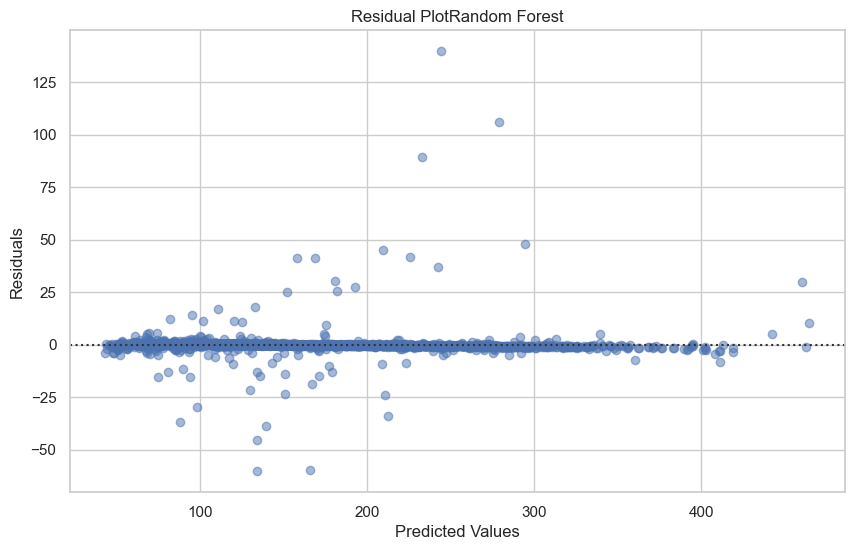

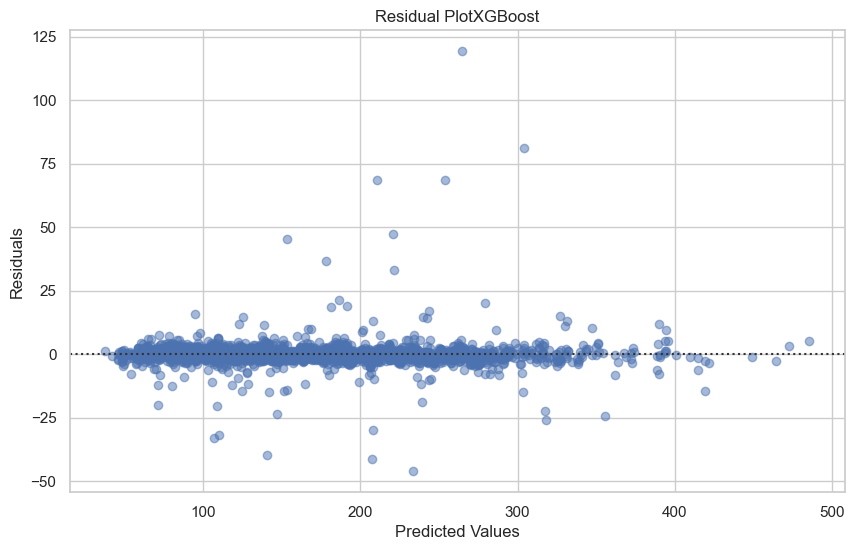

In [39]:
make_residual_plot(y_pred1,y_test1,"Random Forest")
make_residual_plot(y_pred4,y_test1,"XGBoost")

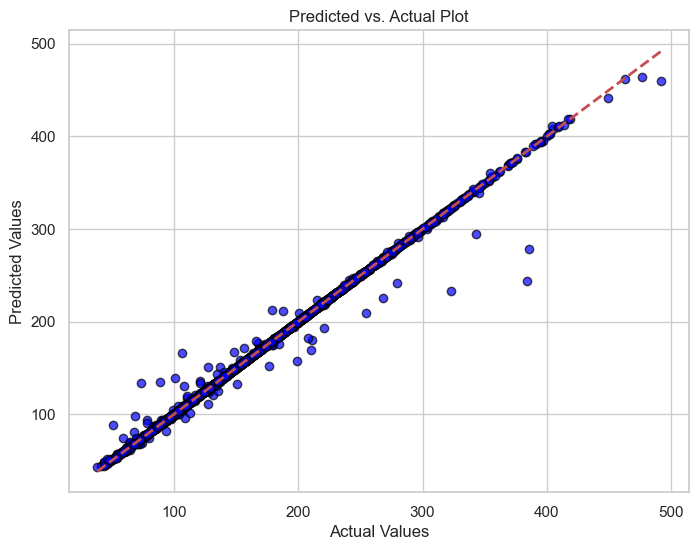

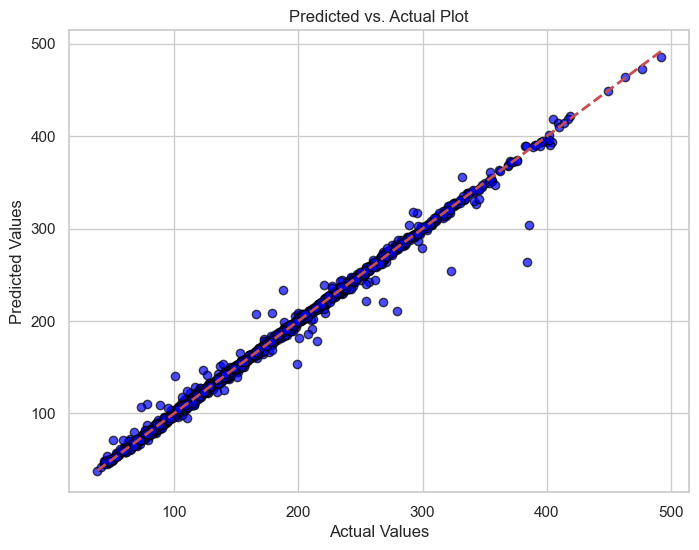

In [40]:
scatter_plot(y_test2,y_pred1,"Random Forest")
scatter_plot(y_test2,y_pred4,"XGBoost")

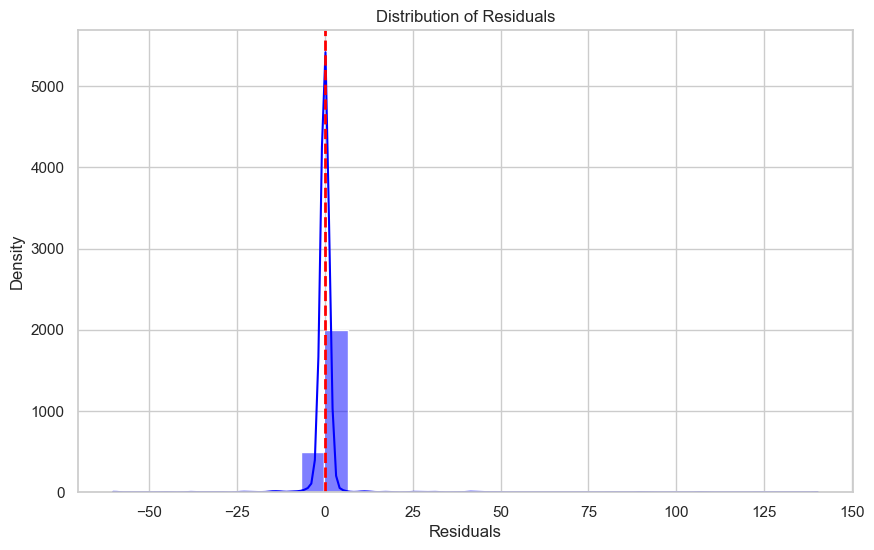

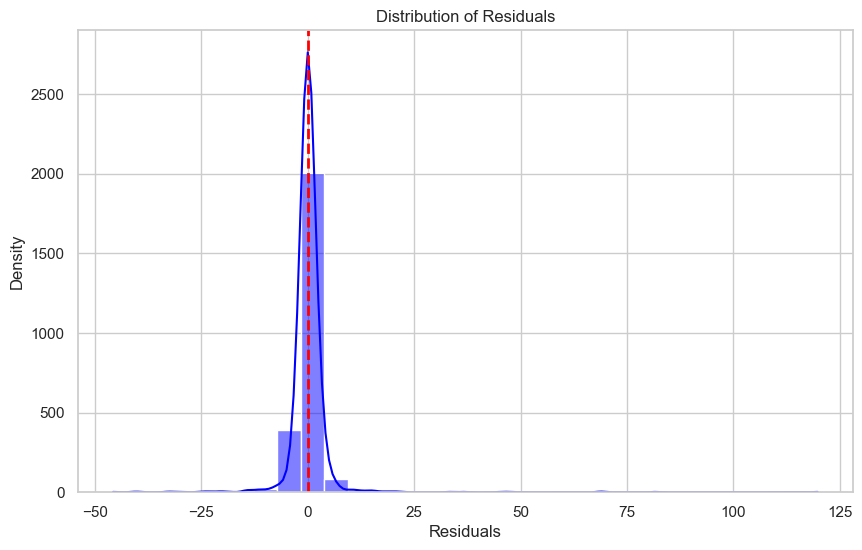

In [41]:
histogram_plot(y_test2,y_pred1,"Random Forest")
histogram_plot(y_test2,y_pred4,"XGBoost")

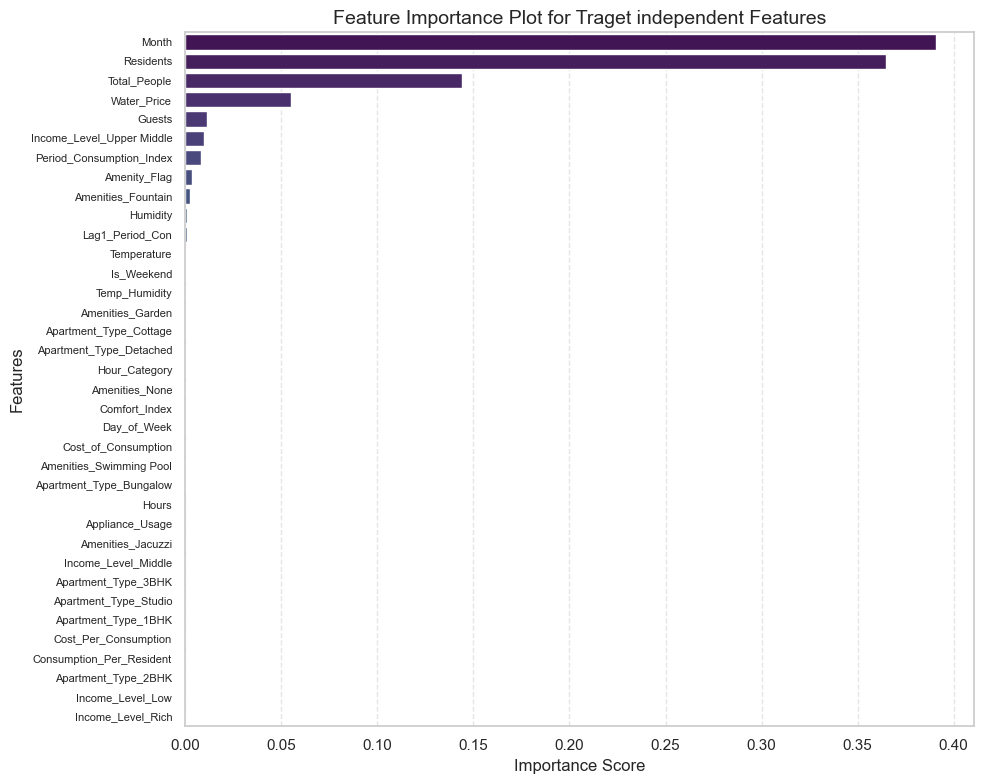

In [42]:
importances = list(rf_model1.feature_importances_)
features = X_data_2.columns
features_dict = {features[i]: importances[i] for i in range(len(features)) if importances[i]>0}
features_dict = dict(sorted(features_dict.items(), key=lambda x: x[1], reverse=True))  # Sort descending
plt.figure(figsize=(10, 8))
sns.barplot(x=list(features_dict.values()), y=list(features_dict.keys()), palette="viridis")
plt.xlabel("Importance Score", fontsize=12)
plt.ylabel("Features", fontsize=12)
plt.yticks(fontsize = 8)
plt.title("Feature Importance Plot for Traget independent Features", fontsize=14)
plt.grid(axis='x', linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

In [43]:
print(""" 1. From the above two phases we  conclude that the target dependent machine learning models are perofroming well that target independent models.\n 2. From the phase one we conclude that the XGBoosting Algorithm is preformming well with an accuracy of 90%.\n 3. From Phase two we can conclude that both the Random forest model and as well as the XGBoosting are preforming well with accuracy of 95% from those two XGboosting is highest with 94.90%.
""")

 1. From the above two phases we  conclude that the target dependent machine learning models are perofroming well that target independent models.
 2. From the phase one we conclude that the XGBoosting Algorithm is preformming well with an accuracy of 90%.
 3. From Phase two we can conclude that both the Random forest model and as well as the XGBoosting are preforming well with accuracy of 95% from those two XGboosting is highest with 94.90%.



In [44]:
print(""" From the target independent values  dataset I will find the predicted values and then using the data values i will extract the target dependent values and apply machine learning algorithm
""")

 From the target independent values  dataset I will find the predicted values and then using the data values i will extract the target dependent values and apply machine learning algorithm



In [ ]:
y_pred_values_test = xg_model.predict(test_features.values)
test_processed["Water_Consumption"]=y_pred_values_test
test_processed["Timestamp"] = test_data["Timestamp"]
final_values = test_processed[['Timestamp','Water_Consumption']]
final_values.to_csv("submission1.csv",index=False)

In [ ]:
test_data['Water_Consumption'] = test_processed['Water_Consumption']
test_data['Water_Consumption'] = test_data['Water_Consumption'].fillna(test_processed['Water_Consumption'].mean())
result_data = test_data[['Timestamp',"Water_Consumption"]]
result_data.to_csv("submission3.csv",index=False)

In [48]:
missing_water_consumption = test_data[test_data['Water_Consumption'].isnull()]
missing_water_consumption

,Timestamp,Water_Consumption


In [ ]:
test_new_values = feature_extraction(test_processed,True,True)
test_new_values = test_new_values.drop("Water_Consumption",axis = 1)

In [ ]:
predicted_values = xg_model1.predict(test_new_values.values)
predicted_values.max()